<a href="https://colab.research.google.com/github/tspecht/colab-projects/blob/main/DogBreedClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Workspace prep

In [1]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [2]:
!pip install tensorflow_addons --quiet

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_addons as tfa
import tensorflow_hub as hub
import matplotlib.pylab as plt
from matplotlib.patches import Rectangle
import numpy as np
import math
import time
import os
import json
from collections import defaultdict
import datetime

print(tf.__version__)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.3 MB/s eta 0:00:00
2.9.2


# Data Preparation

We are utilizing the [Stanford Dogs](http://vision.stanford.edu/aditya86/ImageNetDogs/) dataset for training our model. We use all of the train and split the test dataset 70/30 into validation & test, accordingly. We also load the [imagenette](https://github.com/fastai/imagenette) dataset to get some negative samples in our dataset, helping to build an `unknown` label class.

In [3]:
# Start by loading the Stanford Dogs dataset, our main dataset
(dog_train_dataset, dog_test_dataset), dataset_info = tfds.load('stanford_dogs', with_info=True, split=['train', 'test'])

print("Stanford Dogs is contributing {} test items and {} train items".format(dog_test_dataset.cardinality(), dog_train_dataset.cardinality()))

num_classes = dataset_info.features['label'].num_classes

# Load imagenette as well to get some not-dog samples in there for our custom "unknown category"
(imagenette_train, imagenette_test), _ = tfds.load('imagenette', with_info=True, split=["train", "validation"])

# We need to make sure they are structured the same so the merger of both datasets is opaque to the code below
imagenette_train = imagenette_train.map(lambda x: {"image": x["image"], "image/filename": "none", "label": tf.cast(num_classes, tf.int64), "objects": {"bbox": [[0., 0., 0., 0.]]}})
imagenette_test = imagenette_test.map(lambda x: {"image": x["image"], "image/filename": "none", "label": tf.cast(num_classes, tf.int64), "objects": {"bbox": [[0., 0., 0., 0.]]}})

print("Imagenette is contributing {} test items and {} train items".format(imagenette_test.cardinality(), imagenette_train.cardinality()))

# Merge the datasets
train_dataset = dog_train_dataset.concatenate(imagenette_train)
test_dataset = dog_test_dataset.concatenate(imagenette_test)

# Split out a validation set manually
test_cardinality = test_dataset.cardinality().numpy()
test_percentage = 0.3
num_final_test_samples = int(test_cardinality * test_percentage)

original_test_dataset = test_dataset.shuffle(buffer_size=100)
test_dataset = original_test_dataset.take(num_final_test_samples)
validation_dataset = original_test_dataset.skip(num_final_test_samples)

PIXELS = 224
BATCH_SIZE = 32

# print(dataset_info)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/12000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/0.2.0.incompleteJ3WHBR/stanford_dogs-train.tfrecord*...:   0…

Generating test examples...:   0%|          | 0/8580 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/0.2.0.incompleteJ3WHBR/stanford_dogs-test.tfrecord*...:   0%…

Dataset stanford_dogs downloaded and prepared to /root/tensorflow_datasets/stanford_dogs/0.2.0. Subsequent calls will reuse this data.
Stanford Dogs is contributing 8580 test items and 12000 train items


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/9469 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imagenette/full-size-v2/1.0.0.incompleteY32PEM/imagenette-train.tfrecord*.…

Generating validation examples...:   0%|          | 0/3925 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imagenette/full-size-v2/1.0.0.incompleteY32PEM/imagenette-validation.tfrec…

Dataset imagenette downloaded and prepared to /root/tensorflow_datasets/imagenette/full-size-v2/1.0.0. Subsequent calls will reuse this data.
Imagenette is contributing 3925 test items and 9469 train items


Let's grab some key information about our dataset. This will help make some of the calculations to follow a lot easier.

In [4]:
num_test_examples = test_dataset.cardinality().numpy()
num_train_examples = train_dataset.cardinality().numpy()
num_validation_examples = validation_dataset.cardinality().numpy()

all_classes = dataset_info.features['label'].names

# Add the "unknown" class manually
all_classes.append("unknown")

num_classes = len(all_classes)

print("Train samples: {} ({} dogs)".format(num_train_examples, dog_train_dataset.cardinality()))
print("Test samples: {} ({} dogs)".format(num_test_examples, dog_test_dataset.cardinality().numpy() * test_percentage))
print("Validation samples ({} dogs): ".format(num_validation_examples, dog_test_dataset.cardinality().numpy() * (1.0 - test_percentage)))
print("Total labels: {}".format(num_classes))
print(all_classes)

Train samples: 21469 (12000 dogs)
Test samples: 3751 (2574.0 dogs)
Validation samples (8754 dogs): 
Total labels: 121
['n02085620-chihuahua', 'n02085782-japanese_spaniel', 'n02085936-maltese_dog', 'n02086079-pekinese', 'n02086240-shih-tzu', 'n02086646-blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-rhodesian_ridgeback', 'n02088094-afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-walker_hound', 'n02089973-english_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-irish_wolfhound', 'n02091032-italian_greyhound', 'n02091134-whippet', 'n02091244-ibizan_hound', 'n02091467-norwegian_elkhound', 'n02091635-otterhound', 'n02091831-saluki', 'n02092002-scottish_deerhound', 'n02092339-weimaraner', 'n02093256-staffordshire_bullterrier', 'n02093428-american_staffordshire_terrier', 'n02093647-bedlington_terrier', 'n02093754-border_terrier', 'n02093859-kerry_blue

Prep the different batches by adding prefetching & batching and mapping the items to the expected structure by the model code below. The final batches of data will contain one input called `input` and two targets, `classifier_head` and `locator_head`. `classifier_head` will contain the target labels, `locator_head` the bounding box of the dog in the image in `(1, 4)` format.

In [5]:
def finalize_batch(batch):
  return batch.batch(BATCH_SIZE).prefetch(buffer_size=20000)

def map_dataset(items):
  return ({"input": tf.image.resize(items['image'], (PIXELS, PIXELS))/255}, {
      "classifier_head": items['label'],
      "locator_head": items['objects']['bbox'][0]
  })

dog_only_train_batch = dog_train_dataset.map(map_dataset)
dog_only_validation_batch = dog_test_dataset.map(map_dataset)
test_batch = test_dataset.map(map_dataset)
validation_batch = validation_dataset.map(map_dataset)
train_batch = train_dataset.map(map_dataset).shuffle(num_train_examples // 4)


# Model creation

Model configuration that are currently supported:

1. `MobileNetV2` transfer model, extended by the dog-specific classification layer. The classification utilizes a `Dense` layer with `num_classes` neurons (120 at the time of writing). A `GlobalAveragePooling2D` layer is utilized to align dimensions.
1. Custom (bad) CNN using 3 `Conv2D`, `MaxPooling2D` pairs, followed by dual-output classification and regression layers (for the boxes)
1. `MobileNetV2` transfer model, extended by classification and regression layer for the box-finding.

In [6]:
mobile_net_v2 = tf.keras.applications.MobileNetV2(input_shape=(PIXELS, PIXELS, 3),
                                                  include_top=False,
                                                  weights='imagenet')
mobile_net_v2.trainable = False

multi_output_losses = {
    "classifier_head" : 'sparse_categorical_crossentropy', 
    "locator_head": 'mse'
}

def create_mobile_net_based_model(pixel_dimensions, output_neurons):
  model = tf.keras.Sequential([
      # TODO: Add more here
      # tf.keras.layers.Resizing(PIXELS, PIXELS),
      tf.keras.layers.RandomRotation(45),
      tf.keras.layers.RandomFlip(),
      tf.keras.layers.RandomZoom(0.25),

      mobile_net_v2,

      tf.keras.layers.GlobalAveragePooling2D(),

      tf.keras.layers.Dense(output_neurons, activation='softmax')
  ], name="MobileNetV2_SingleClassifier")

  model.compile(optimizer=tf.keras.optimizers.Adamax(0.0001),
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy', 'top_k_categorical_accuracy'])
  return model

def _dual_output_branches(base_layer, output_classifier_neurons, include_dropout=False):
    # Create the classifier brach detecting the breed
    classifier_branch = tf.keras.layers.GlobalAveragePooling2D(name='classifier_1')(base_layer)

    if include_dropout:
      classifier_branch = tf.keras.layers.Dropout(0.25)(classifier_branch)

    classifier_branch = tf.keras.layers.Dense(output_classifier_neurons, activation="softmax", name='classifier_head')(classifier_branch)

    # Create the branch for locating the bounding box
    locator_branch = tf.keras.layers.Dense(128, activation='relu', name='locator_1')(base_layer)
    for layer in [
        tf.keras.layers.Dense(64, activation='relu', name='locator_2'),
        tf.keras.layers.Dense(32, activation='relu', name='locator_3'),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4, activation='sigmoid', name='locator_head')
    ]:
      locator_branch = layer(locator_branch)

    return classifier_branch, locator_branch

def create_basic_dual_output_model(pixel_dimensions, output_classifier_neurons):
  # Create the common input layer
  input_layer = tf.keras.layers.Input((pixel_dimensions, pixel_dimensions, 3), name="input")

  # Create the base layer 
  base_layer = tf.keras.layers.Rescaling(1./255)(input)

  for layer in [
      tf.keras.layers.Resizing(224, 224),
      tf.keras.layers.Conv2D(16, 3, padding='same', activation='relu', name='base_layer_2'),
      tf.keras.layers.MaxPooling2D(name='base_layer_3'),
      
      tf.keras.layers.Conv2D(32, 3, padding='same', activation='relu', name='base_layer_4'),
      tf.keras.layers.MaxPooling2D(name='base_layer_5'),
      
      tf.keras.layers.Conv2D(64, 3, padding='same', activation='relu', name='base_layer_6'),
      tf.keras.layers.MaxPooling2D(name='base_layer_7'),
      
      tf.keras.layers.Flatten(name='base_layer_8')
  ]:
    base_layer = layer(base_layer)

  # Create the classifier & locator braches detecting the breed
  classifier_branch, locator_branch = _dual_output_branches(base_layer, output_classifier_neurons)

  model = tf.keras.Model(input_layer,
                         outputs=[classifier_branch,locator_branch],
                         name="basic_dual_output_cnn")

  model.compile(loss=multi_output_losses, optimizer='Adam', metrics=['accuracy', 'top_k_categorical_accuracy'])
  
  return model
  
def create_mobilenet_v2_dual_output_model(pixel_dimensions, output_classifier_neurons, tag=None, include_dropout=False):
  # Create the common input layer
  input_layer = tf.keras.layers.Input((pixel_dimensions, pixel_dimensions, 3), name="input")

  # Create the base layer 
  base_layer = mobile_net_v2(tf.keras.layers.Resizing(pixel_dimensions, pixel_dimensions)(input_layer))

  # Create the classifier & locator braches detecting the breed
  classifier_branch, locator_branch = _dual_output_branches(base_layer, output_classifier_neurons, include_dropout=include_dropout)

  model = tf.keras.Model(input_layer,
                         outputs=[classifier_branch,locator_branch],
                         name="mobile_net_v2_dual_output" + "_{}".format(tag) if tag else "")

  model.compile(loss=multi_output_losses, optimizer='Adam', metrics=['accuracy'])
  
  return model

def create_inception_v3_dual_output_model(pixel_dimensions, output_classifier_neurons):
  # Create the common input layer
  input_layer = tf.keras.layers.Input((pixel_dimensions, pixel_dimensions, 3), name="input")

  # Create the base layer 
  base_layer= tf.keras.applications.InceptionV3(input_shape=(pixel_dimensions, pixel_dimensions, 3),
                                                include_top=False)(tf.keras.layers.Resizing(pixel_dimensions, pixel_dimensions)(input_layer))

  # Create the classifier & locator braches detecting the breed
  classifier_branch, locator_branch = _dual_output_branches(base_layer, output_classifier_neurons)

  model = tf.keras.Model(input_layer,
                         outputs=[classifier_branch,locator_branch],
                         name="inception_v3_dual_output")

  model.compile(loss=multi_output_losses, optimizer='Adam', metrics=['accuracy', 'top_k_categorical_accuracy'])
  
  return model

def create_vgg16_dual_output_model(pixel_dimensions, output_classifier_neurons):
  # Create the common input layer
  input_layer = tf.keras.layers.Input((pixel_dimensions, pixel_dimensions, 3), name="input")

  # Create the base layer 
  base_layer= tf.keras.applications.VGG16(input_shape=(pixel_dimensions, pixel_dimensions, 3),
                                          include_top=False)(tf.keras.layers.Resizing(pixel_dimensions, pixel_dimensions)(input_layer))

  # Create the classifier & locator braches detecting the breed
  classifier_branch, locator_branch = _dual_output_branches(base_layer, output_classifier_neurons)

  model = tf.keras.Model(input_layer,
                         outputs=[classifier_branch,locator_branch],
                         name="vgg16_dual_output")

  model.compile(loss=multi_output_losses, optimizer='Adam', metrics=['accuracy', 'top_k_categorical_accuracy'])
  
  return model

9406464/9406464 [==============================] - 0s 0us/step


Fit the models to the test data. This block contains a bunch of commented-out code that needs to be put back in for certain models to run. All model runs should utilize the same `callbacks`, `batch_size`, `shuffle` and `validation_data`.

In [7]:
histories = []
epochs = 10

# model = create_mobile_net_based_model(pixel_dimensions=PIXELS, output_neurons=num_classes)
# model = create_basic_dual_output_model(pixel_dimensions=PIXELS, output_classifier_neurons=num_classes)
model = create_mobilenet_v2_dual_output_model(pixel_dimensions=PIXELS, 
                                              output_classifier_neurons=num_classes,
                                              tag='multi_run_dropout',
                                              include_dropout=True)
# model = create_inception_v3_dual_output_model(pixel_dimensions=PIXELS, output_classifier_neurons=num_classes)
# model = create_vgg16_dual_output_model(pixel_dimensions=PIXELS, output_classifier_neurons=num_classes)

tf.keras.utils.plot_model(model, show_shapes=True)

logdir = os.path.join("logs", "{}-{}".format(model.name, datetime.datetime.now().strftime("%Y%m%d-%H%M%S")))
print("Logging to {}".format(logdir))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

early_stopping = tf.keras.callbacks.EarlyStopping(patience=3)

# common_kwargs = {
#     "callbacks": [early_stopping],  # tensorboard_callback, 
#     "batch_size": BATCH_SIZE,
#     "shuffle": True,
#     "validation_data": validation_batch,
# }

# histories.append(
#     model.fit(train_batch, 
#               epochs=epochs, 
#               **common_kwargs)
# )


##### COMMENT STUFF ABOVE OUT AND ADD a tag to the model
print("Using {} train and {} dog-only validation images".format(dog_only_train_batch.cardinality(), dog_only_validation_batch.cardinality()))

# Build a second training set with dog + other images, including plenty of augmentations to further increase the dataset
extended_image_train_batch = train_batch
extended_image_validation_batch = validation_batch
for mapper in [
    lambda inputs, targets: ({"input": tf.keras.layers.RandomZoom(.2)(inputs["input"])}, targets),
    lambda inputs, targets: ({"input": tf.keras.layers.RandomRotation(0.1)(inputs["input"])}, targets),
    lambda inputs, targets: ({"input": tf.keras.layers.RandomFlip()(inputs["input"])}, targets)
]:
  mapped_train_batch = train_batch.map(mapper)
  mapped_validation_batch = validation_batch.map(mapper)

  extended_image_train_batch = extended_image_train_batch.concatenate(mapped_train_batch)
  extended_image_validation_batch = extended_image_validation_batch.concatenate(mapped_validation_batch)
  

# Do the first run with all layers trainable, but only running the original dog dataset
# This will train both the classifer as well as the locator. Once the locator is good enough,
# we train with more variations to futher improve the classifier
common_kwargs = {
    "callbacks": [tensorboard_callback],
    "batch_size": BATCH_SIZE,
    "shuffle": True,
    "validation_data": dog_only_validation_batch.batch(BATCH_SIZE),
}

print("Starting first training run, dogs only ({} training examples)...".format(dog_only_train_batch.cardinality()))
histories.append(
    model.fit(dog_only_train_batch.batch(BATCH_SIZE), 
              epochs=epochs, 
              **common_kwargs)
)

# # Do a second run training with only the classifier
disabled_layers = []
for layer in model.layers:
  # Disable all layers but the classifier ones
  if not layer.name.startswith('classifier'):
        layer.trainable = False
        disabled_layers.append(layer)

print("Disabled layers for second run:", [layer.name for layer in disabled_layers])

print("Starting second training run, classifier only with augmentation...")
common_kwargs["validation_data"] = extended_image_validation_batch.batch(BATCH_SIZE)

# Recompile the model so we can change the metrics for the second run
model.compile(loss={
    "classifier_head" : 'sparse_categorical_crossentropy'
}, optimizer='Adam', metrics=['accuracy', 'top_k_categorical_accuracy'])

# Run the second fit
histories.append(
    model.fit(extended_image_train_batch.batch(BATCH_SIZE), 
              epochs=epochs,  # One more full round
              **common_kwargs)
)

print("Reenabling layers")
for layer in disabled_layers:
  layer.trainable = True


# history = model.fit(train_label_dataset, epochs=EPOCHS, validation_data=test_label_dataset)


# Do a first general training run
# histories.append(model.fit(train_batch, epochs=5
#                            **common_kwargs))

# # # Do a second run training with only the classifier
# disabled_layers = []
# for layer in model.layers:
#   # Disable all layers but the classifier ones
#   if not layer.name.startswith('classifier'):
#         layer.trainable = False
#         disabled_layers.append(layer)

# print("Disabled layers for second run:", [layer.name for layer in disabled_layers])

# histories.append(model.fit(train_batch, epochs=5, **common_kwargs))

# print("Reenabling layers")
# for layer in disabled_layers:
#   layer.trainable = True

Logging to logs/mobile_net_v2_dual_output_multi_run_dropout-20230206-144522
Using 12000 train and 8580 dog-only validation images
Starting first training run, dogs only (12000 training examples)...
Epoch 1/10
375/375 [==============================] - 54s 102ms/step - loss: 1.6315 - classifier_head_loss: 1.6204 - locator_head_loss: 0.0111 - classifier_head_accuracy: 0.5857 - locator_head_accuracy: 0.7254 - val_loss: 0.8630 - val_classifier_head_loss: 0.8555 - val_locator_head_loss: 0.0075 - val_classifier_head_accuracy: 0.7510 - val_locator_head_accuracy: 0.7633
Epoch 2/10
375/375 [==============================] - 38s 101ms/step - loss: 0.6574 - classifier_head_loss: 0.6516 - locator_head_loss: 0.0058 - classifier_head_accuracy: 0.8032 - locator_head_accuracy: 0.7826 - val_loss: 0.7686 - val_classifier_head_loss: 0.7614 - val_locator_head_loss: 0.0072 - val_classifier_head_accuracy: 0.7692 - val_locator_head_accuracy: 0.7728
Epoch 3/10
375/375 [==============================] - 36s 96

In [8]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Analysis

Compile a summary of the validation results & training progress. Save it both to disk as well as to the cell itself.

118/118 [==============================] - 7s 57ms/step - loss: 1.7850 - classifier_head_loss: 1.7850 - classifier_head_accuracy: 0.7414 - classifier_head_top_k_categorical_accuracy: 0.0573 - locator_head_accuracy: 0.7678 - locator_head_top_k_categorical_accuracy: 1.0000

    Model Summary:
      Model: "mobile_net_v2_dual_output_multi_run_dropout"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 resizing (Resizing)            (None, 224, 224, 3)  0           ['input[0][0]']                  
                                                       

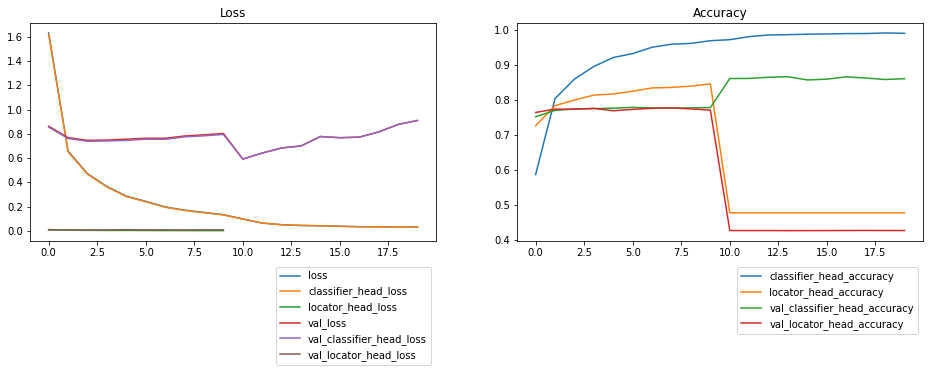

In [9]:
def merge_histories(histories):
  merged = defaultdict(list)

  for history in histories:
    # Merge all the actual measurements
    for key, value in history.history.items():
      merged[key] += value

    # Merge the epochs
    num_existing_epochs = len(merged["epoch"])
    merged["epoch"] += [e + num_existing_epochs for e in history.epoch]
  
  return merged

results = model.evaluate(test_batch.batch(BATCH_SIZE), batch_size=BATCH_SIZE, return_dict=True)

merged_history = merge_histories(histories)

epochs_range = merged_history["epoch"]
dir_name = 'results/run_{}_{}'.format(model.name, datetime.datetime.now().strftime("%Y%m%d_%H%M%S"))

model_summary = []
model.summary(print_fn=lambda x: model_summary.append(x))
model_summary = "\n".join(model_summary)

results_text = """
    Model Summary:
      {}

    Evaluation Results:
      {}
  """.format(model_summary, json.dumps(results, indent=8))
print(results_text)

# Save the results
if not os.path.exists(dir_name):
  os.makedirs(dir_name)
with open("{}/results.txt".format(dir_name), "w+") as file:
  file.write(results_text)

# Extract the data for both charts dynamically based on what's available
data = {'loss': {}, 'accuracy': {}}

for key, value in merged_history.items():
  # Skip the epoch key
  if key == "epoch":
    continue

  if key.endswith("_loss") or key == "loss":
    data['loss'][key] = value
  else:
    if "top_k" not in key:
      data['accuracy'][key] = value

# Plot the data
plot_index = 0
plt.figure(figsize=(16, 4))

for key, metrics in data.items():
  plt.subplot(1, 2, plot_index + 1)
  for metric_name, values in metrics.items():
    plt.plot(values, label=metric_name)
  plt.legend(loc='upper right', bbox_to_anchor=(1, -0.1))

  title = 'Accuracy' if key == 'accuracy' else "Loss"
  plt.title(title)

  plot_index += 1

plt.savefig("{}/plots.png".format(dir_name))
plt.show()



Plot some results

1/1 [==============================] - 1s 755ms/step


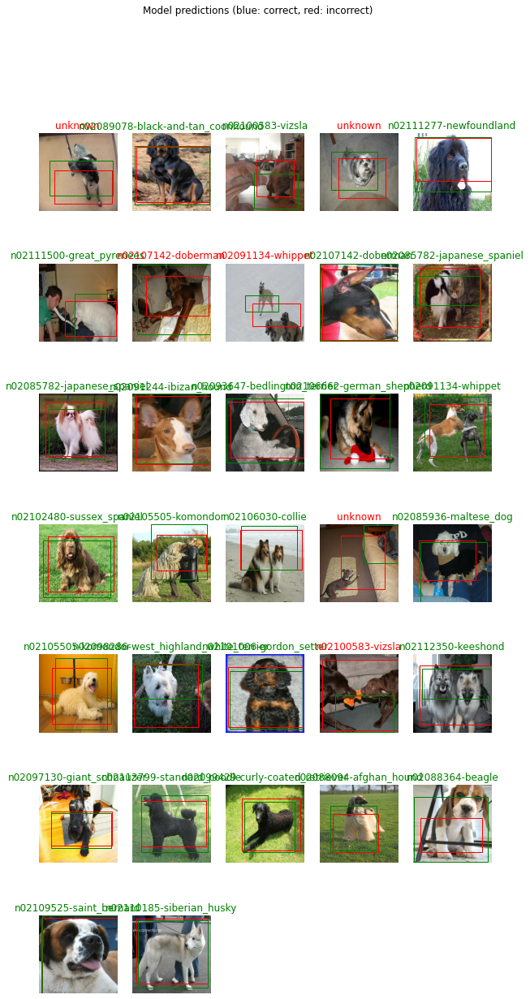

In [10]:
# Some helper functions first
def plot_image_and_box(plot, image, predicted_box=None):
  plot.imshow(image)

  # Add the bounding boxes we detected
  if predicted_box:
    plot.add_patch(Rectangle((predicted_box[0], predicted_box[1]), predicted_box[2], predicted_box[3],
                      edgecolor='red',
                      facecolor='none',
                      lw=1))

def convert_box(box, pixel_dimension):
  x = box[0] * pixel_dimension
  y = box[1] * pixel_dimension
  return (x, y, box[2] * pixel_dimension - x, box[3] * pixel_dimension - y)

# Get a batch of images and their results
image_batch, target_batch = next(iter(test_batch.batch(BATCH_SIZE).take(1)))

# Run the predictions.
(label_predictions, box_predictions) = model.predict(image_batch)

# Transform the prediction data into something that is actually usable
images = image_batch["input"]
label_targets = target_batch['classifier_head'].numpy()
label_predictions = np.argmax(label_predictions, axis=-1)
box_targets = target_batch['locator_head'].numpy()

# Start plotting
plt.figure(figsize=(10, 20))
plt.suptitle("Model predictions (blue: correct, red: incorrect)")

# Define the dimensions of our grid. num_rows is calculated dynamically since the batch size isn't static (defined above)
num_columns = 5
num_rows = math.ceil(len(images) / num_columns)

# Loop through all the images and render them as their own subplot
for index, image in enumerate(images):
  ax = plt.subplot(num_rows,num_columns, index+1)
  plt.subplots_adjust(hspace = 0.3)

  # Show the image and the predicted box
  plot_image_and_box(ax, image, convert_box(box_predictions[index], PIXELS))

  # Add the correct one as well
  target_box = convert_box(box_targets[index], PIXELS)
  ax.add_patch(Rectangle((target_box[0], target_box[1]), target_box[2], target_box[3],
                    edgecolor='green',
                    facecolor='none',
                    lw=1))

  # Color-code if we predicted correctly or not
  color = "green" if label_predictions[index] == label_targets[index] else "red"
  plt.title(all_classes[label_predictions[index]], color=color)
  plt.axis('off')



Try some random pictures from the internet

Image downloaded to /tmp/tmpw309hkoz.jpg.
1/1 [==============================] - 1s 1s/step
Image downloaded to /tmp/tmpzxesfnz0.jpg.
1/1 [==============================] - 0s 20ms/step
Image downloaded to /tmp/tmp0qx69pdx.jpg.
1/1 [==============================] - 0s 21ms/step
Image downloaded to /tmp/tmpkmg_u2b0.jpg.
1/1 [==============================] - 0s 23ms/step
Image downloaded to /tmp/tmpq82kkyhx.jpg.
1/1 [==============================] - 0s 28ms/step


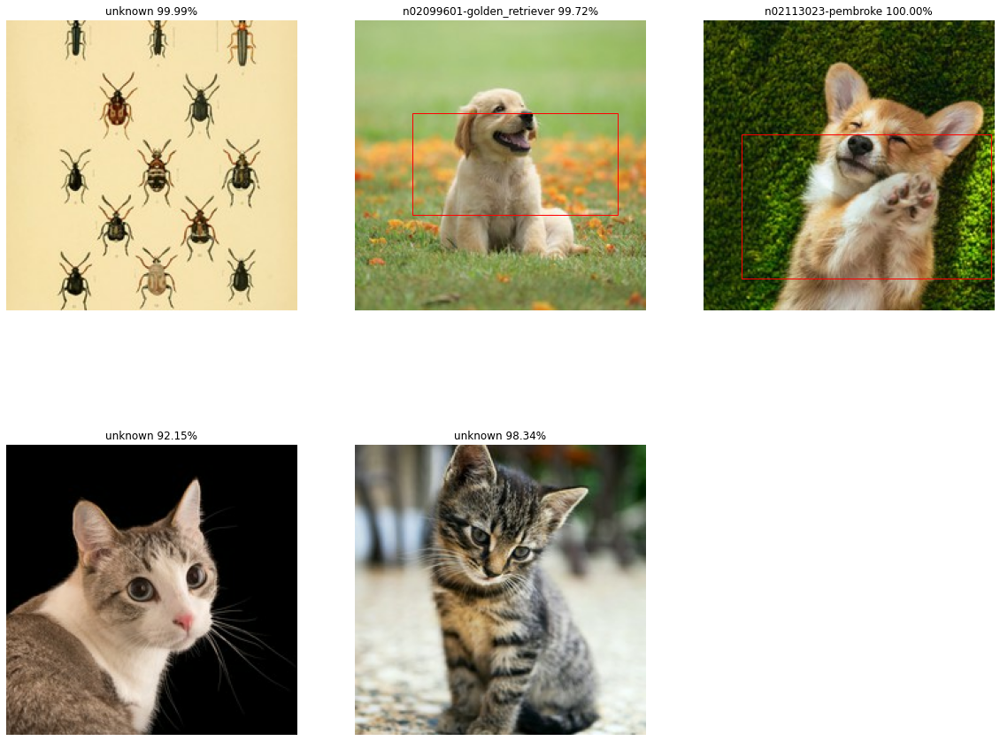

In [11]:
from PIL import Image, ImageOps
import tempfile
from urllib.request import urlopen
from six import BytesIO

def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  return filename

def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

urls = [
    "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
    "https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/dog-puppy-on-garden-royalty-free-image-1586966191.jpg?crop=0.752xw:1.00xh;0.175xw,0&resize=1200:*",
    "https://www.travelandleisure.com/thmb/6xTNZI_Hd_oEXieQdZXAVjgtla8=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/corgi-dog-POPDOGNAME1020-ebc7e573ca6e476b859c6092ac8589a4.jpg",
    "https://i.natgeofe.com/n/548467d8-c5f1-4551-9f58-6817a8d2c45e/NationalGeographic_2572187_square.jpg",
    "https://images.unsplash.com/photo-1529778873920-4da4926a72c2?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxzZWFyY2h8Mnx8Y3V0ZSUyMGNhdHxlbnwwfHwwfHw%3D&w=1000&q=80"
]

# Start plotting
fig = plt.figure(figsize=(20, len(urls) * 5))

# Define the dimensions of our grid. num_rows is calculated dynamically since the batch size isn't static (defined above)
num_columns = 3
num_rows = math.ceil(len(urls) / num_columns) + 1

for index, url in enumerate(urls):
  file_path = download_and_resize_image(url, PIXELS, PIXELS)
  image = load_img(file_path)
  converted_img = tf.image.convert_image_dtype(image, tf.float32)[tf.newaxis, ...]

  (label_predictions, box_predictions) = model.predict({"input": converted_img})
  max_label_certainty = max(label_predictions[0])
  label_prediction_index = np.argmax(label_predictions[0])
  predicted_breed = all_classes[label_prediction_index]

  ax = plt.subplot(num_rows, num_columns, index+1)
  ax.set_anchor('N')
  # plt.subplots_adjust(wspace=10, hspace=5)

  # plt.subplots_adjust(hspace = 1.3)
  is_unknown = predicted_breed == "unknown"
  plot_image_and_box(ax, image, convert_box(box_predictions[0], PIXELS) if not is_unknown else None)

  plt.title("{0} {1:.2f}%".format(predicted_breed, max_label_certainty * 100))
  plt.axis('off')

  # start_time = time.time()
  # result = detector(converted_img)
  # end_time = time.time()